# ツリーマップ

## 概要

**ツリーマップ（Tree Map）**とは，階層構造（ツリー構造）を持つ質的変数に対して，その比率を四角形の面積で表現するグラフです．

![](../figs/charts/tree.png)

例えば上図は，雑誌別・作品別の掲載週数の割合を表現したツリーマップです．

## Plotlyによる作図方法

Plotlyでは，`plotly.express.treemap()`でツリーマップを作成可能です．

```python
import plotly.express as px
fig = px.treemap(df, path=['col_0', 'col_1',], values='col_values')
```

上記の例では，`df`の`col_0`，`col_1`列の順に細分化したツリーマップを作成します．
このとき，各要素の面積は`col_values`列を基準に決定されます．

もちろん，`path`に三つ以上の列を指定すれば，三階層以上のツリーマップも作成可能です．

## MADB Labを用いた作図例

### 下準備

In [1]:
import pandas as pd
import plotly.express as px

import warnings
warnings.filterwarnings('ignore')

In [2]:
# 前処理の結果，以下に分析対象ファイルが格納されていることを想定
PATH_DATA = '../../data/preprocess/out/episodes.csv'
# Jupyter Book用のPlotlyのrenderer
RENDERER = 'plotly_mimetype+notebook'

In [3]:
def show_fig(fig):
    """Jupyter Bookでも表示可能なようRendererを指定"""
    fig.update_layout(margin=dict(t=50, l=25, r=25, b=25))
    fig.show(renderer=RENDERER)

In [4]:
def add_years_to_df(df, unit_years=10):
    """unit_years単位で区切ったyears列を追加"""
    df_new = df.copy()
    df_new['years'] = \
        pd.to_datetime(df['datePublished']).dt.year \
        // unit_years * unit_years
    df_new['years'] = df_new['years'].astype(str)
    return df_new

In [5]:
df = pd.read_csv(PATH_DATA)

### 雑誌別・年代別の合計作品数

In [6]:
col_count = 'cname'

In [7]:
# 1年単位で区切ったyearsを追加
df = add_years_to_df(df, 10)
# mcname, yearsで集計
df_plot = \
    df.groupby(['mcname', 'years'])[col_count].\
    nunique().reset_index()
df_plot = \
    df_plot.sort_values(['years', 'mcname'], ignore_index=True)

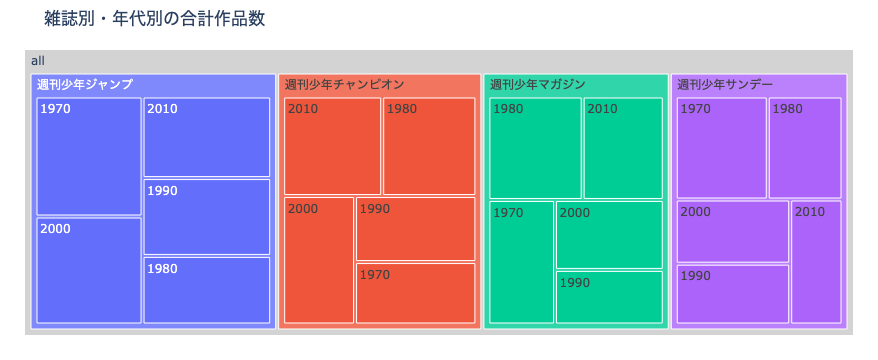

In [8]:
fig = px.treemap(
    df_plot, path=[px.Constant('all'), 'mcname', 'years'],
    values=col_count, title='雑誌別・年代別の合計作品数')
fig.update_traces(root_color='lightgrey')
show_fig(fig)

### 雑誌別・作品別の合計掲載週数

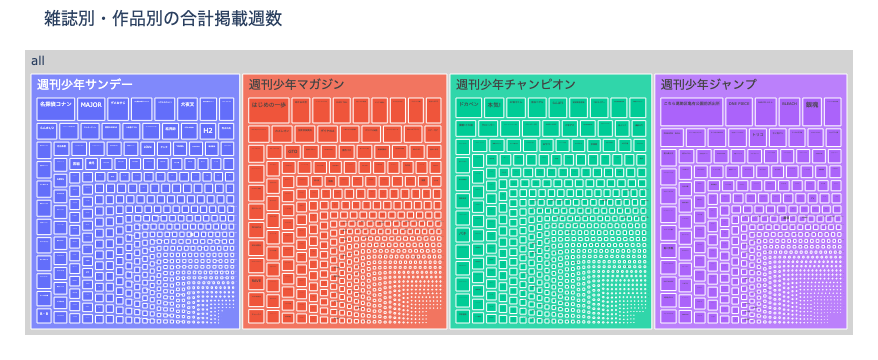

In [9]:
df_plot = \
    df.groupby('mcname')['cname'].value_counts().\
    reset_index(name='weeks')
# 描画用に10週以上の作品に絞る
df_plot = df_plot[df_plot['weeks']>=10].reset_index(drop=True)
fig = px.treemap(
    df_plot, path=[px.Constant('all'), 'mcname', 'cname'],
    values='weeks', title='雑誌別・作品別の合計掲載週数')
fig.update_traces(root_color='lightgrey')
show_fig(fig)

### 雑誌別・年代別の合計作家数

In [10]:
col_count = 'creator'

In [11]:
# 1年単位で区切ったyearsを追加
df = add_years_to_df(df, 10)
# mcname, yearsで集計
df_plot = \
    df.groupby(['mcname', 'years'])[col_count].\
    nunique().reset_index()
df_plot = \
    df_plot.sort_values(['years', 'mcname'], ignore_index=True)

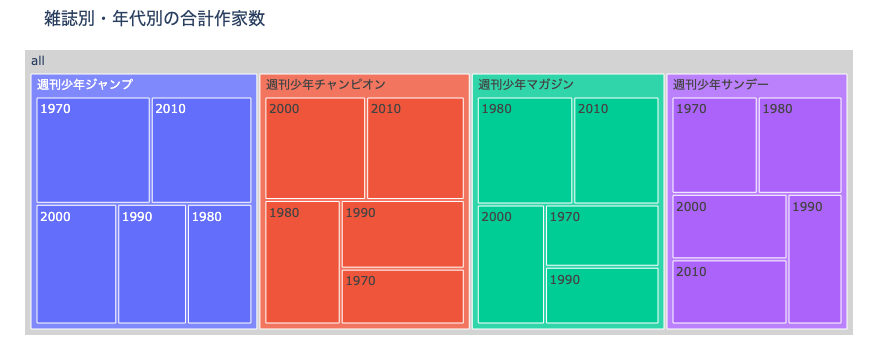

In [12]:
fig = px.treemap(
    df_plot, path=[px.Constant('all'), 'mcname', 'years'],
    values=col_count, title='雑誌別・年代別の合計作家数')
fig.update_traces(root_color='lightgrey')
show_fig(fig)

### 雑誌別・作家別の合計掲載週数

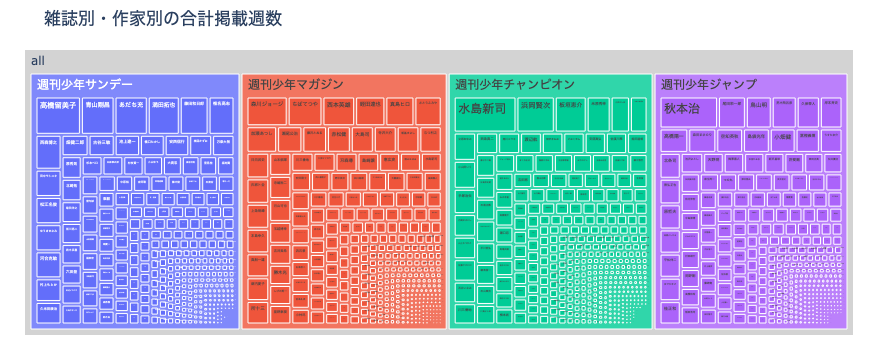

In [13]:
df_plot = \
    df.groupby('mcname')['creator'].value_counts().\
    reset_index(name='weeks')
# 描画用に10週以上の作者に絞る
df_plot = df_plot[df_plot['weeks']>=10].reset_index(drop=True)
fig = px.treemap(
    df_plot, path=[px.Constant('all'), 'mcname', 'creator'],
    values='weeks', title='雑誌別・作家別の合計掲載週数')
fig.update_traces(root_color='lightgrey')
show_fig(fig)